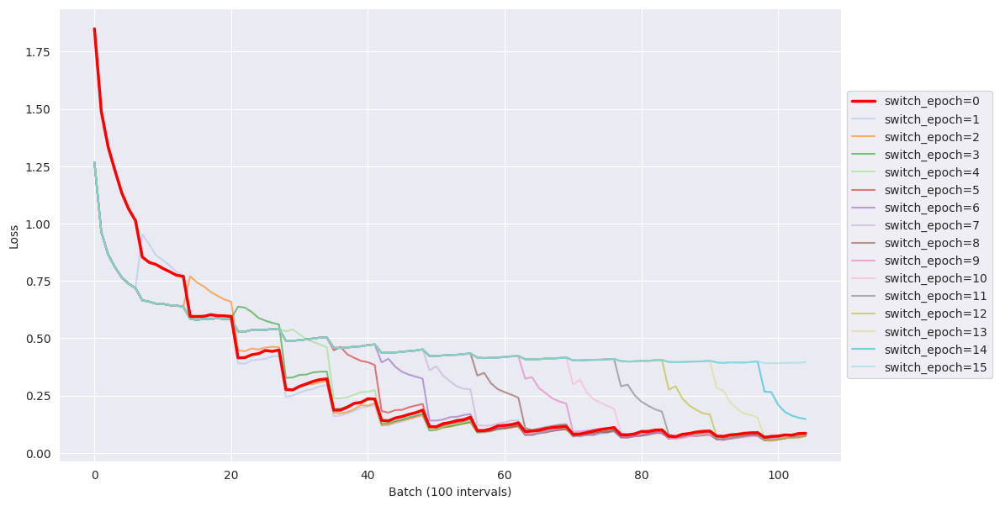

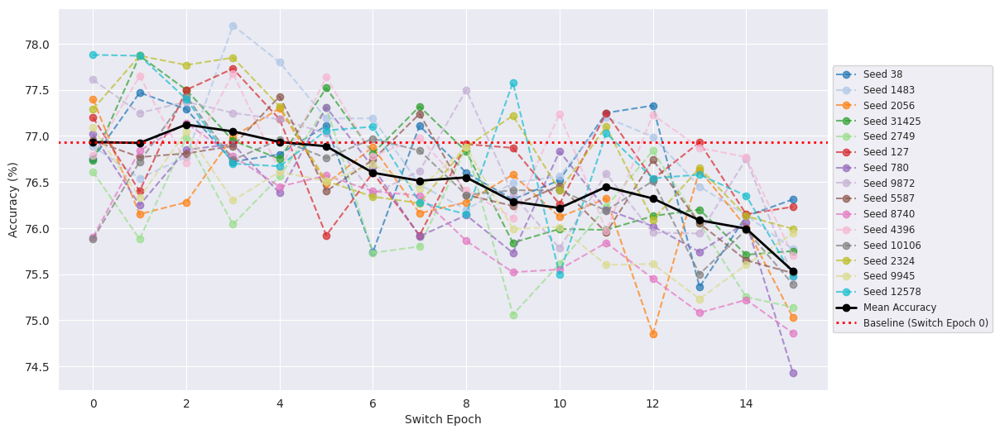

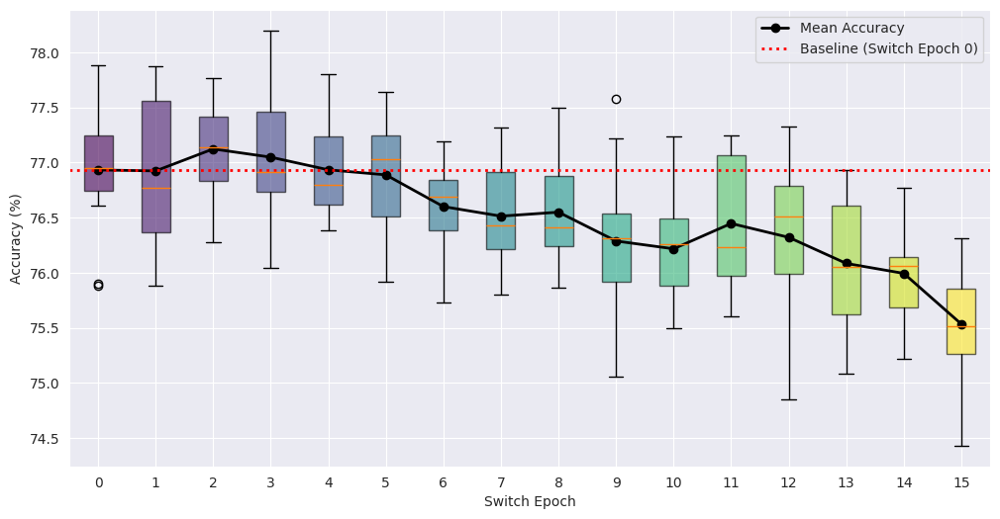

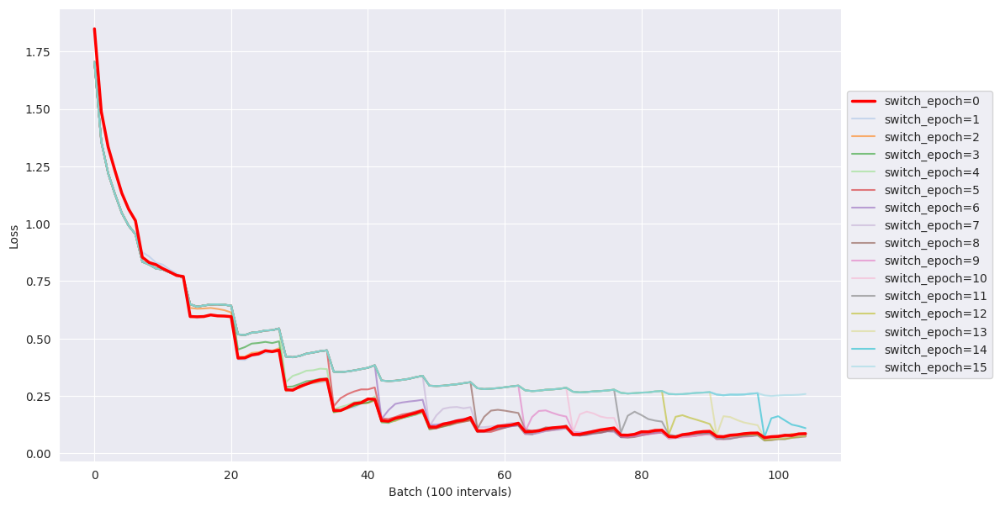

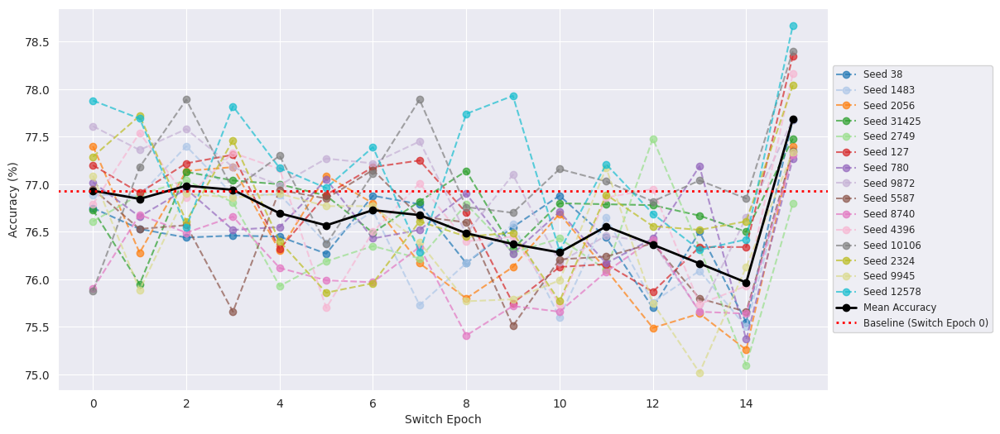

...

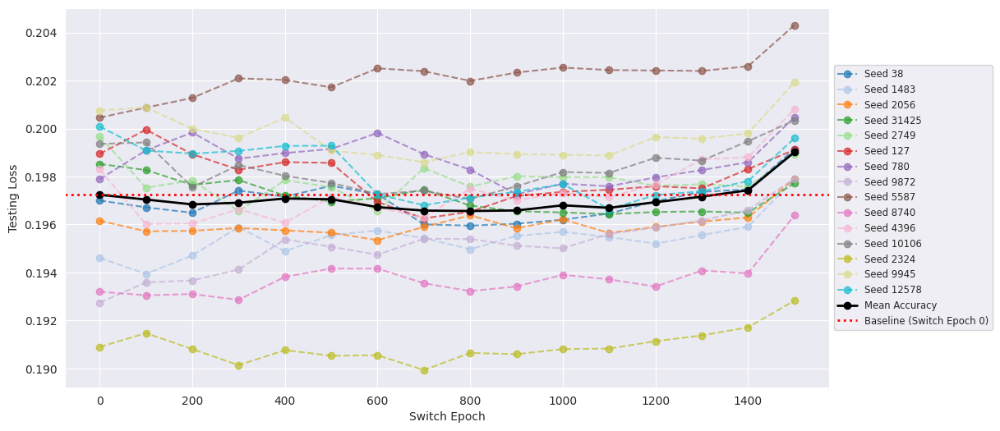

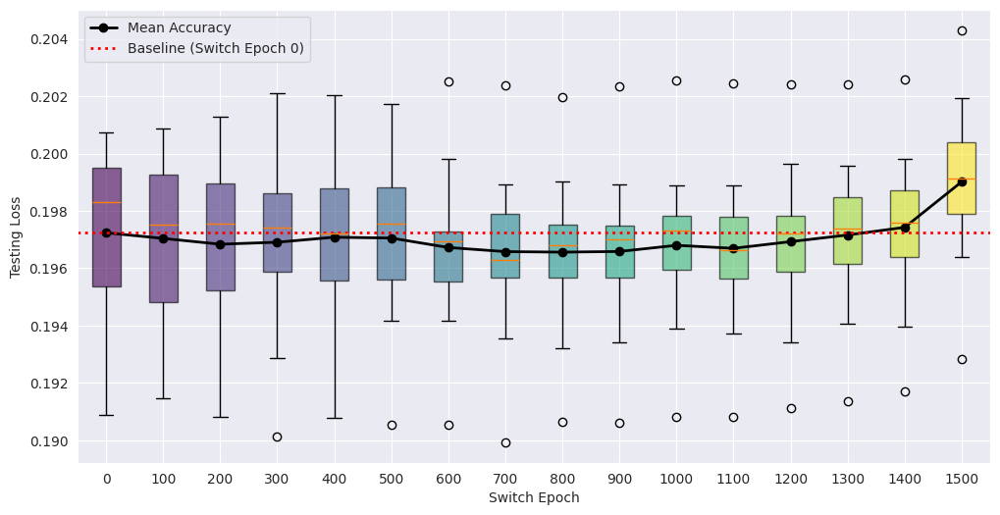

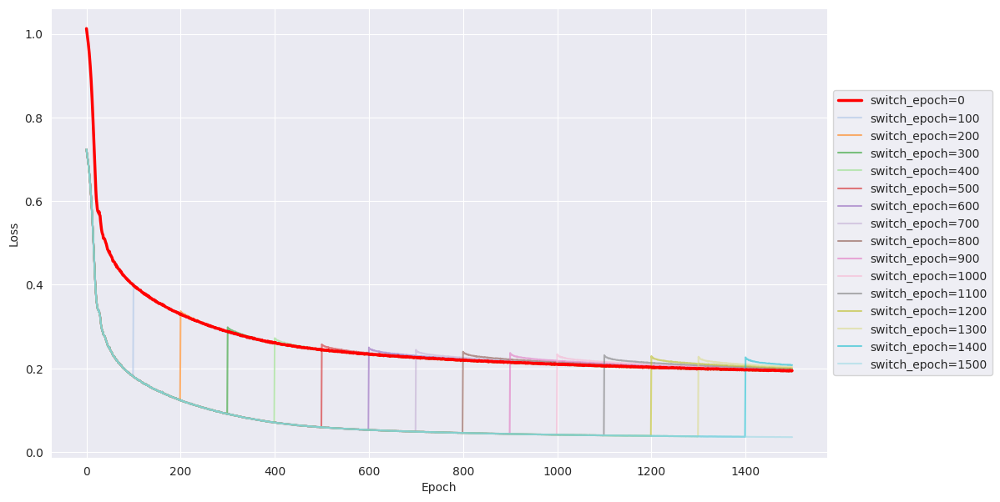

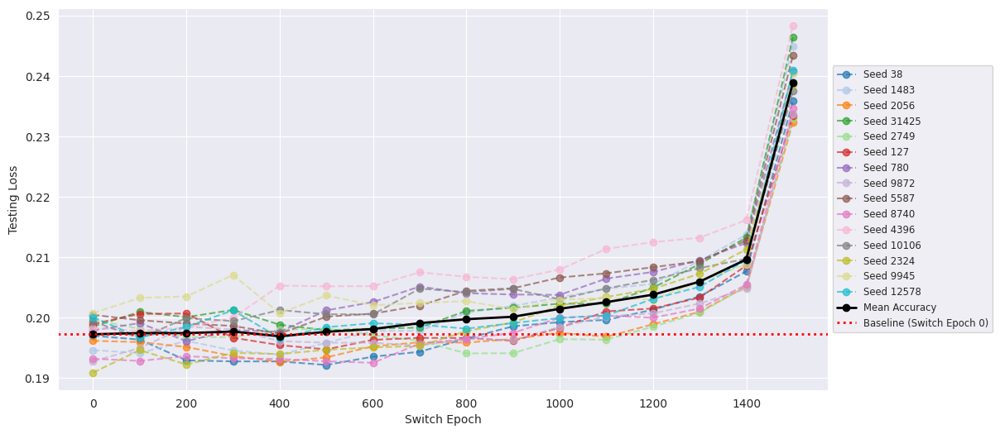

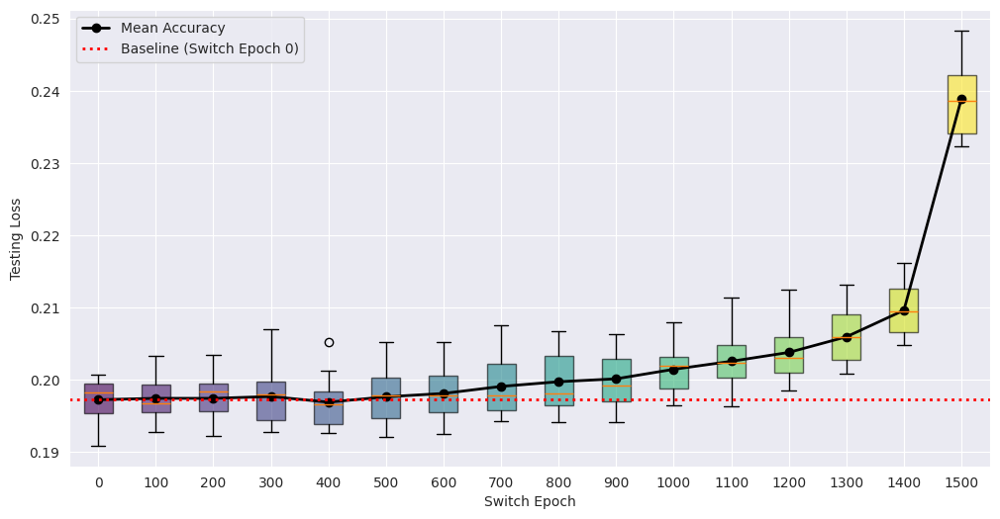

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import os
import re

output_dir = "../outputs"
def extract_experiment_number(name):
    match = re.search(r'experiment(\d+)', name)
    return int(match.group(1)) if match else float('inf')

experiment_paths = sorted(
    [os.path.join(output_dir, d) for d in os.listdir(output_dir) if d.startswith("experiment")],
    key=extract_experiment_number
)

seeds = np.loadtxt("../scripts/configs/seeds.txt", dtype=int).tolist()

for experiment_path in experiment_paths:
    experiment_number = extract_experiment_number(experiment_path)
    if experiment_number >= 19:
        switch_epochs = list(range(0, 1501, 100))
    else:
        switch_epochs = list(range(0,16,1))
    run_accuracies = []
    all_losses = {epoch: [] for epoch in switch_epochs}
    for run,seed in enumerate(seeds):
        results = {}
        switch_epoch_accuracies = []
        for switch_epoch in switch_epochs:
            if switch_epoch == 0:
                experiment_number = extract_experiment_number(experiment_path)
                if experiment_number < 10:
                    student_dataset = "student_cifar"
                elif experiment_number < 19:
                    student_dataset = "student_fashion_mnist"
                else:
                    student_dataset = "student_california_housing"
                path = f"../outputs/{student_dataset}/model_seed_{seed}"
            else:
                path = f"{experiment_path}/seed_{seed}/switch_epoch_{switch_epoch}"
            
            training_losses = np.loadtxt(f"{path}/training_losses.txt")
            results[switch_epoch] = training_losses
            accuracy = np.loadtxt(f"{path}/accuracy.txt")
            switch_epoch_accuracies.append(accuracy)
            all_losses[switch_epoch].append(training_losses)
        run_accuracies.append(switch_epoch_accuracies)
    
    
    mean_losses = {epoch: np.mean(all_losses[epoch], axis=0) for epoch in switch_epochs}
    plt.figure(figsize=(12, 7))
    colors = plt.cm.tab20(np.linspace(0, 1, len(switch_epochs)))
    for idx, (switch_epoch, losses) in enumerate(mean_losses.items()):
        if switch_epoch == 0:
            plt.plot(losses, label=f'switch_epoch={switch_epoch}', color='red', linewidth=2.5, zorder=10)
        else:
            plt.plot(losses, label=f'switch_epoch={switch_epoch}', color=colors[idx], alpha=0.6, linewidth=1.5, zorder=1)
    if experiment_number >= 19:
        plt.xlabel('Epoch')
    else:
        plt.xlabel('Batch (100 intervals)')
    plt.ylabel('Loss')
    #plt.title(f'Mean Running Loss Comparison of Different Switch Epoch Values, path: {experiment_path}')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    save_path = f"{experiment_path}".replace("../outputs/", "") + "_training_loss.pdf"
    plt.savefig(f"../graphs/experiments/{save_path}", bbox_inches='tight')
    plt.show()
    
    plt.figure(figsize=(12, 6))
    colors = plt.cm.tab20(np.linspace(0, 1, len(switch_epochs)))
    for run,seed in enumerate(seeds):
        plt.plot(switch_epochs, run_accuracies[run], marker='o', linestyle='dashed', label=f'Seed {seed}', color=colors[run], alpha=0.7)
    mean_accuracies = np.mean(run_accuracies, axis=0)
    plt.plot(switch_epochs, mean_accuracies, marker='o', linestyle='solid', color='black', linewidth=2, label='Mean Accuracy')
    plt.axhline(y=mean_accuracies[0], color='red', linestyle='dotted', linewidth=2, label='Baseline (Switch Epoch 0)')
    plt.xlabel('Switch Epoch')
    if experiment_number >= 19:
        plt.ylabel('Testing Loss')
    else:
        plt.ylabel('Accuracy (%)')
    #plt.title(f'Impact of Switch Epoch on Model Accuracy, path: {experiment_path}')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
    plt.grid(True)
    plt.show()
    
    switch_epochs = 16
    run_accuracies = np.array(run_accuracies)
    accuracies_per_epoch = [run_accuracies[:, i] for i in range(switch_epochs)]
    positions = list(range(switch_epochs))
    plt.figure(figsize=(12, 6))
    box = plt.boxplot(accuracies_per_epoch, positions=positions, patch_artist=True, showfliers=True)
    colors = plt.cm.viridis(np.linspace(0, 1, switch_epochs))
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.6)
    mean_accuracies = np.nanmean(run_accuracies, axis=0)
    plt.plot(positions, mean_accuracies, color='black', linestyle='-', linewidth=2, marker='o', label='Mean Accuracy')
    plt.axhline(y=mean_accuracies[0], color='red', linestyle='dotted', linewidth=2, label='Baseline (Switch Epoch 0)')
    plt.xlabel('Switch Epoch')
    if experiment_number >= 19:
        plt.ylabel('Testing Loss')
        switch_epoch_values = list(range(0, 1501, 100))
        plt.xticks(ticks=positions, labels=switch_epoch_values)
    else:
        plt.ylabel('Accuracy (%)')
    #plt.title(f'Impact of Switch Epoch on Model Accuracy (Boxplot), path: {experiment_path}')
    plt.legend()
    plt.grid(True)
    save_path = f"{experiment_path}".replace("../outputs/", "") + "_boxplot.pdf"
    plt.savefig(f"../graphs/experiments/{save_path}", bbox_inches='tight')
    plt.show()
    